---
---
# Previsão do Nível de Satisfação dos Clientes do Santander
---
---

O objetivo deste projeto é prever o nível de satisfação dos clientes do Santander.

A satisfação do cliente é uma medida fundamental de sucesso. Clientes insatisfeitos cancelam seus serviços e raramente expressam sua insatisfação antes de sair. Clientes satisfeitos, por outro lado, tornam-se defensores da marca. Dessa forma, a identificação de clientes insatisfeitos no início do relacionamento permite a adoção de medidas proativas para reverter essa situação antes que seja tarde.

A proposta, então, é criar um modelo de aprendizagem de máquina que possa prever se um cliente está ou não insatisfeito com sua experiência bancária a partir de um dataset com centenas de recursos anônimos fornecido pelo Santander na plataforma do Kaggle.

O projeto faz parte da Formação Cientista de Dados, oferecida pela Data Science Academy.



_Santander Customer Satisfaction_
---


_The objective of this project is to predict the level of satisfaction of Santander's customers._

_Customer satisfaction is a key measure of success. Unhappy customers don't stick around and rarely voice their dissatisfaction before leaving. Satisfied customers, on the other hand, become brand advocates. Thus, the identification of dissatisfied customers early in the relationship allows the adoption of proactive steps to reverse this situation before it's too late._

_The proposal then is to create a machine learning model that can predict whether or not a customer is unssatisfied with their banking experience from a dataset with hundreds of anonymous resources provided by Santander on the Kaggle platform._ 
 
_The project is part of the Data Scientist Training, offered by Data Science Academy._



---

## Análise Exploratória de Dados // _Exploratory Data Analysis - EDA_

In [1]:
# Versão da Linguagem Python // Python language version
from platform import python_version
print('Versão da Linguagem Python Usada Neste Jupyter Notebook:', python_version())

Versão da Linguagem Python Usada Neste Jupyter Notebook: 3.9.12


In [2]:
# Imports
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Versões dos pacotes usados neste jupyter notebook // Versions of packages used in this jupyter notebook
#!pip install -q -U watermark
%reload_ext watermark
%watermark -a "Tatiana Novaes Carvalho" --iversions

Author: Tatiana Novaes Carvalho

matplotlib: 3.5.1
pandas    : 1.4.2
numpy     : 1.22.3
seaborn   : 0.11.2



In [4]:
# Parâmetros de configuração dos gráficos // Graph configuration parameters
from matplotlib import rcParams

rcParams['figure.figsize'] = 20, 18
rcParams['lines.linewidth'] = 4
rcParams['xtick.labelsize'] = 'x-large'
rcParams['ytick.labelsize'] = 'x-large'

sns.set_style('darkgrid')

### Carga dos dados // _Data load_

In [5]:
# Carrega os dados // Load the data
file = 'train'
df = pd.read_csv(f'../datasets/{file}.csv', index_col = 0)

In [6]:
df.shape

(76020, 370)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76020 entries, 1 to 151838
Columns: 370 entries, var3 to TARGET
dtypes: float64(111), int64(259)
memory usage: 215.2 MB


In [8]:
df.head(5)

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
ID,,,,,,,,,,,,,,,,,,,,,
1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0


In [9]:
df.tail(5)

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
ID,,,,,,,,,,,,,,,,,,,,,
151829,2,48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490000,0
151830,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,118634.520000,0
151835,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,74028.150000,0
151836,2,25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84278.160000,0
151838,2,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0


In [10]:
# Categorias por variável // Categories by variable

print(f'Total de Categorias por Variável:')
print()
for col in df.columns:
    print(f'{col}: {df[col].nunique()}, {df[col].dtype}')

Total de Categorias por Variável:

var3: 208, int64
var15: 100, int64
imp_ent_var16_ult1: 596, float64
imp_op_var39_comer_ult1: 7551, float64
imp_op_var39_comer_ult3: 9099, float64
imp_op_var40_comer_ult1: 293, float64
imp_op_var40_comer_ult3: 346, float64
imp_op_var40_efect_ult1: 23, float64
imp_op_var40_efect_ult3: 29, float64
imp_op_var40_ult1: 224, float64
imp_op_var41_comer_ult1: 7421, float64
imp_op_var41_comer_ult3: 8961, float64
imp_op_var41_efect_ult1: 331, float64
imp_op_var41_efect_ult3: 454, float64
imp_op_var41_ult1: 8032, float64
imp_op_var39_efect_ult1: 336, float64
imp_op_var39_efect_ult3: 462, float64
imp_op_var39_ult1: 8149, float64
imp_sal_var16_ult1: 66, float64
ind_var1_0: 2, int64
ind_var1: 2, int64
ind_var2_0: 1, int64
ind_var2: 1, int64
ind_var5_0: 2, int64
ind_var5: 2, int64
ind_var6_0: 2, int64
ind_var6: 2, int64
ind_var8_0: 2, int64
ind_var8: 2, int64
ind_var12_0: 2, int64
ind_var12: 2, int64
ind_var13_0: 2, int64
ind_var13_corto_0: 2, int64
ind_var13_corto: 

In [11]:
# Apuração de recursos com apenas uma informação // Resources with only one piece of information

# Variáveis com quantidade de valor único igual a 1
unique_var_list = [col for col in df.columns if df[col].nunique() == 1]
df_unique = df[unique_var_list]

# Apuração do valor único
for col in df_unique.columns:
    print(df[col].value_counts())
    
# Identificação das variáveis com valor único igual a zero
print()
print(f'Quantidade de variáveis com valor único igual a 0: {len(unique_var_list)}\n')
#print(f'Variáveis com valor único igual a 0: {unique_var_list}')

0    76020
Name: ind_var2_0, dtype: int64
0    76020
Name: ind_var2, dtype: int64
0    76020
Name: ind_var27_0, dtype: int64
0    76020
Name: ind_var28_0, dtype: int64
0    76020
Name: ind_var28, dtype: int64
0    76020
Name: ind_var27, dtype: int64
0    76020
Name: ind_var41, dtype: int64
0    76020
Name: ind_var46_0, dtype: int64
0    76020
Name: ind_var46, dtype: int64
0    76020
Name: num_var27_0, dtype: int64
0    76020
Name: num_var28_0, dtype: int64
0    76020
Name: num_var28, dtype: int64
0    76020
Name: num_var27, dtype: int64
0    76020
Name: num_var41, dtype: int64
0    76020
Name: num_var46_0, dtype: int64
0    76020
Name: num_var46, dtype: int64
0    76020
Name: saldo_var28, dtype: int64
0    76020
Name: saldo_var27, dtype: int64
0    76020
Name: saldo_var41, dtype: int64
0    76020
Name: saldo_var46, dtype: int64
0    76020
Name: imp_amort_var18_hace3, dtype: int64
0    76020
Name: imp_amort_var34_hace3, dtype: int64
0    76020
Name: imp_reemb_var13_hace3, dtype: int64
0

_**Observação:**_
Existem 34 variáveis cujo valor único é igual a 0 (zero).
---
_**Observation:**_
_There are 34 variables whose single value is equal to 0 (zero)._

### Separação das Variáveis Categóricas e Numéricas // _Separation of Categorical and Numerical Variables_

In [12]:
# Identificação das variáveis categóricas // Categorical variables identification

cat_features = [] # categorical features
num_features = [] # numerical features

# Identificação das variáveis com quantidade de valor único maior ou igual a 2
tot_var_set = set(df.columns)
unique_var_set = set(unique_var_list)
var_list = list(tot_var_set - unique_var_set)

# Separação das variáveis categóricas e numéricas (critério: 2 <= qtde de valor único <= 10)
for col in df[var_list].columns:
    if df[col].nunique() <= 10:
        cat_features.append(col)
    else:
        num_features.append(col)

# Variável-alvo
target = 'TARGET'

print(len(cat_features))
print(len(num_features))


205
131


In [13]:
# Conversão dos tipos de dados das variáveis // Conversion of variables data types

# Categóricas
for feat in cat_features:
    df[feat] = df[feat].astype('category')

# Numéricas
for feat in num_features:
    df[feat] = df[feat].astype('float64')

# Target
df[target] = df[target].astype('category')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76020 entries, 1 to 151838
Columns: 370 entries, var3 to TARGET
dtypes: category(205), float64(131), int64(34)
memory usage: 111.2 MB


In [15]:
# Tipos dos dados de cada variável após conversão // Data types of each variable after conversion
df.dtypes

var3                        float64
var15                       float64
imp_ent_var16_ult1          float64
imp_op_var39_comer_ult1     float64
imp_op_var39_comer_ult3     float64
                             ...   
saldo_medio_var44_hace3     float64
saldo_medio_var44_ult1      float64
saldo_medio_var44_ult3      float64
var38                       float64
TARGET                     category
Length: 370, dtype: object

### Exploração da Variável alvo // _Exploration of Target Variable_

In [16]:
# Variável-alvo // Target
df[target].value_counts()

0    73012
1     3008
Name: TARGET, dtype: int64

Satisfied Customer: 73012
Insatisfied Customer: 3008


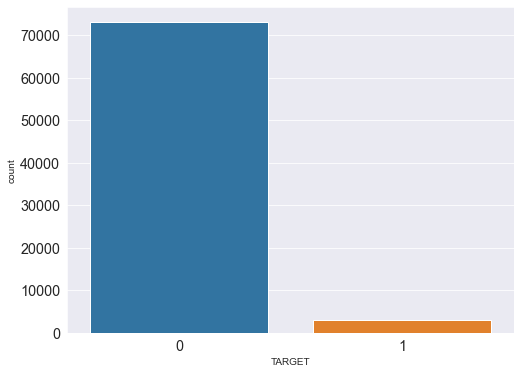

In [17]:
# Análise da variável target // Target Variable Analysis

# Plot
plt.figure(figsize = (8, 6))
sns.countplot(data = df, x = target, label = 'Count')

# Value counts
df[target].value_counts()           
no, yes = df[target].value_counts() 

# Print
print(f'Satisfied Customer: {no}')
print(f'Insatisfied Customer: {yes}')

_**Observação:**_
As classes da variável target estão desbalanceadas.
---
_**Observation:**_
_The target variable classes are unbalanced._

> Criação de dataset com amostras para análise gráfica dos dados

In [18]:
df_sample = df.sample(1000, random_state = 42) 

### Exploração das Variáveis Categóricas // _Exploration of Categorical Variables_

In [19]:
# Resumo das variáveis categóricas // Summary of categorical variables
df[cat_features].describe()

,saldo_medio_var13_medio_ult3,ind_var6_0,saldo_var29,delta_imp_trasp_var33_in_1y3,ind_var34,num_aport_var13_ult1,num_venta_var44_ult1,saldo_var18,saldo_medio_var29_hace3,num_var41_0,...,ind_var7_emit_ult1,ind_var13_corto,ind_var5,num_var29_0,delta_imp_aport_var17_1y3,ind_var40_0,ind_var43_recib_ult1,ind_var39,imp_trasp_var17_out_ult1,num_aport_var17_ult1
count,76020.0,76020,76020.0,76020,76020,76020,76020,76020,76020.0,76020,...,76020,76020,76020,76020,76020.0,76020,76020,76020,76020.0,76020
unique,3.0,2,3.0,3,2,7,9,3,2.0,9,...,2,2,2,2,7.0,2,2,2,5.0,8
top,0.0,0,0.0,0,0,0,0,0,0.0,3,...,0,0,1,0,0.0,0,0,0,0.0,0
freq,76018.0,76012,76018.0,76009,76018,75619,75976,76018,76019.0,65398,...,76017,72867,50459,76012,75960.0,75152,66190,75737,76016.0,75976


In [20]:
# Frequências de cada categoria das variáveis categóricas // Frequencies of each category of categorical variables
for feat in cat_features:
    print(df[feat].value_counts())
    print()

0.0         76018
7293.12         1
18870.99        1
Name: saldo_medio_var13_medio_ult3, dtype: int64

0    76012
1        8
Name: ind_var6_0, dtype: int64

0.0        76018
11976.6        1
19531.8        1
Name: saldo_var29, dtype: int64

0             76009
-1                6
9999999999        5
Name: delta_imp_trasp_var33_in_1y3, dtype: int64

0    76018
1        2
Name: ind_var34, dtype: int64

0     75619
3       373
6        17
9         6
12        3
24        1
30        1
Name: num_aport_var13_ult1, dtype: int64

0     75976
3        24
6         7
9         4
12        3
21        2
27        2
15        1
39        1
Name: num_venta_var44_ult1, dtype: int64

0          76018
300000         1
3000000        1
Name: saldo_var18, dtype: int64

0.0      76019
145.2        1
Name: saldo_medio_var29_hace3, dtype: int64

3     65398
0      9177
6      1359
9        75
12        6
15        2
18        1
21        1
33        1
Name: num_var41_0, dtype: int64

0    75891
1      1

0    73012
1     3008
Name: TARGET, dtype: int64

0.0        76018
276.24         1
1096.02        1
Name: imp_amort_var34_ult1, dtype: int64

0    76018
1        2
Name: ind_var13_medio, dtype: int64

0    76018
3        2
Name: num_var13_medio_0, dtype: int64

0     75998
3        12
6         6
12        3
9         1
Name: num_aport_var17_hace3, dtype: int64

0    75737
1      283
Name: ind_var40, dtype: int64

0     72564
3      3418
6        37
15        1
Name: num_var12, dtype: int64

0    71059
1     4961
Name: ind_var37, dtype: int64

0    75744
3      276
Name: num_var20_0, dtype: int64

0    75928
1       92
Name: ind_var32_cte, dtype: int64

0    74223
1     1797
Name: ind_var25, dtype: int64

0    75988
3       20
6        9
9        3
Name: num_compra_var44_hace3, dtype: int64

0    76017
1        3
Name: ind_var7_emit_ult1, dtype: int64

0    72867
1     3153
Name: ind_var13_corto, dtype: int64

1    50459
0    25561
Name: ind_var5, dtype: int64

0    76012
3        8
N

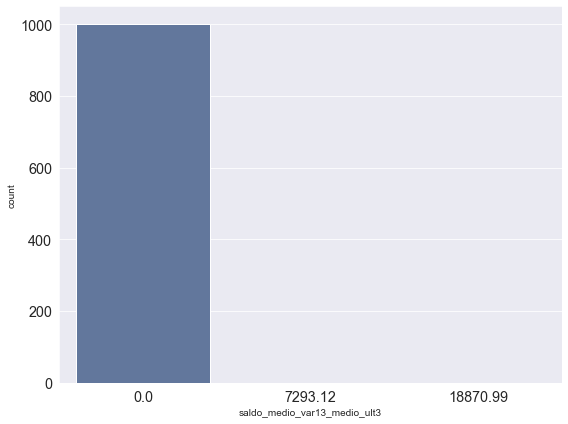

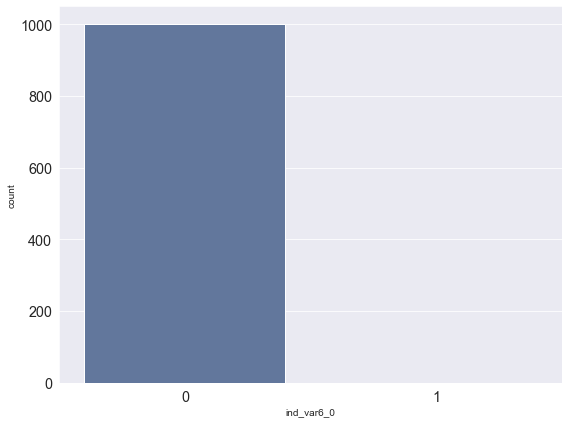

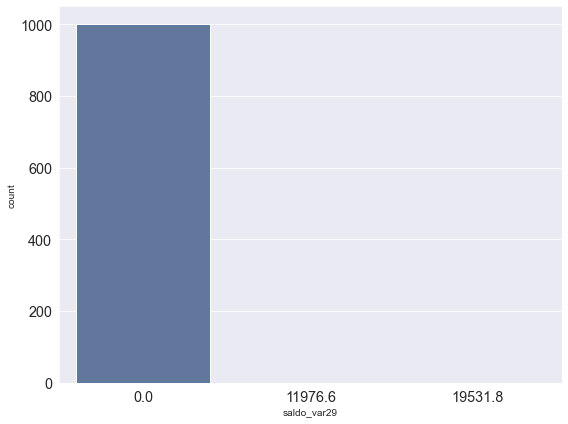

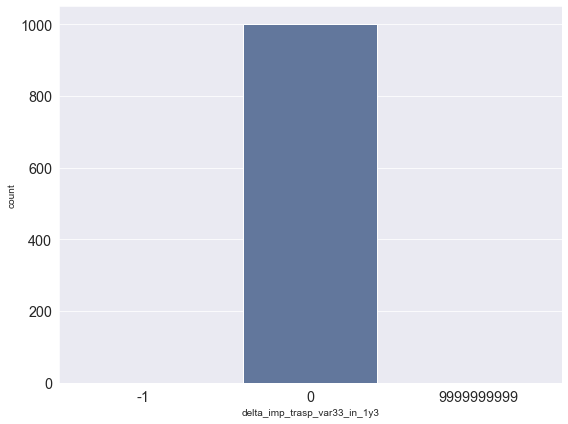

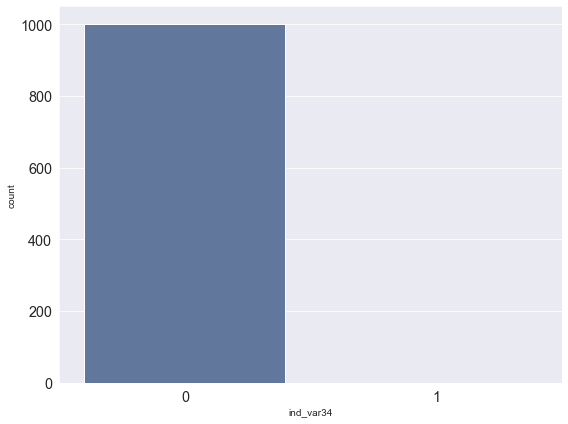

...

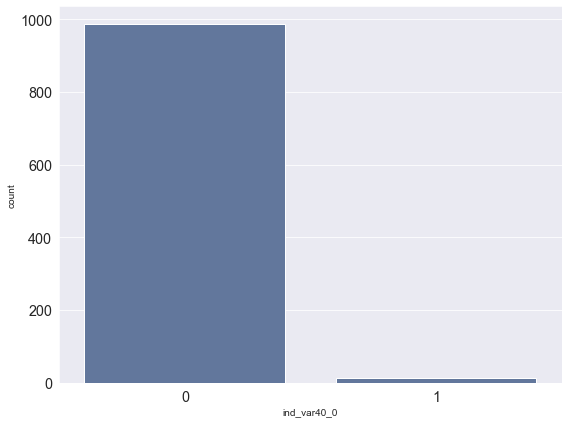

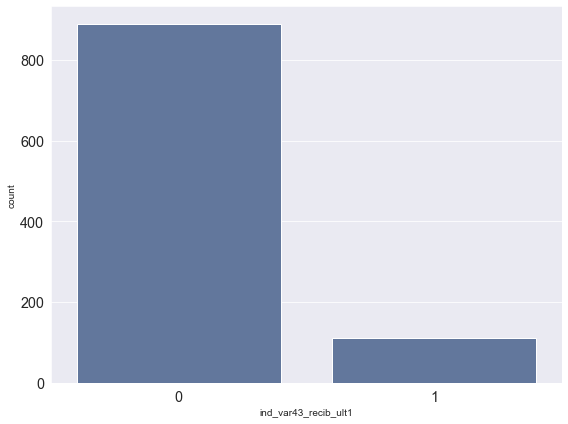

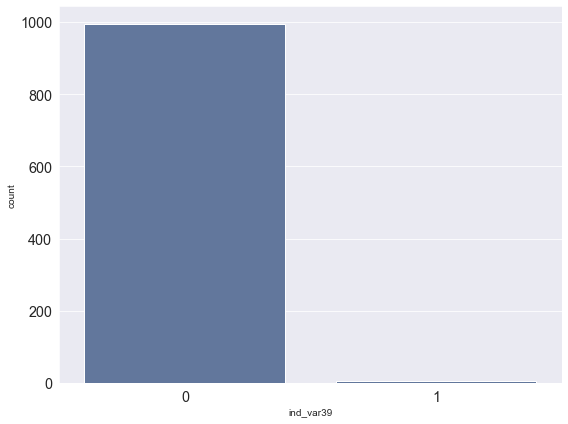

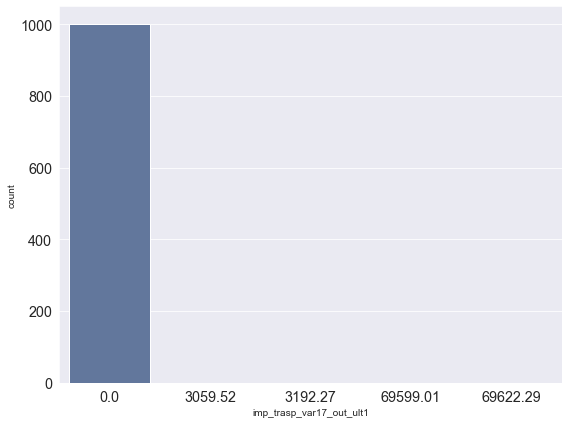

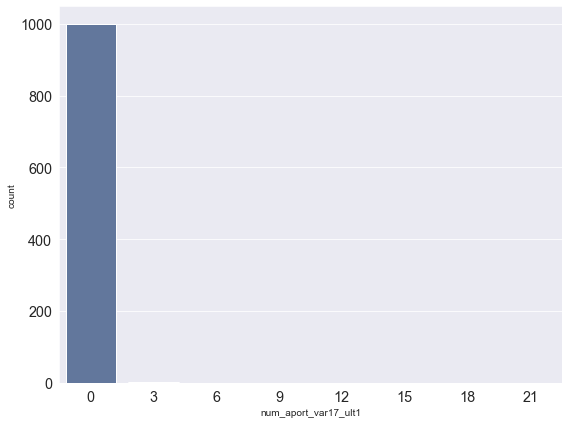

In [21]:
# Análise univariada das variáveis categóricas // Univariate analysis of categorical variables
  
def plot_countplot_cat(df, features_list:list):
    """
    Função para análise univariada de variáveis categóricas com gráficos de contagem da biblioteca Seaborn.
    Function for univariate analysis of categorical variables with count graphs from the Seaborn library.
    """
    for i in range(0, len(features_list)):
        plt.figure(figsize = (8, 6))
        chart = sns.countplot(x = features_list[i], data = df, color = '#5975a5', orient = 'v')
        plt.tight_layout()
    
    return chart

# Chamada à função

plot_countplot_cat(df_sample, cat_features);

### Colunas Categóricas x Variável Target // _Categorical Columns x Target Variable_

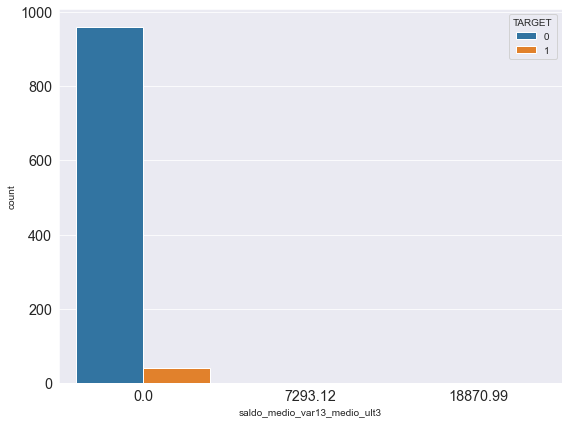

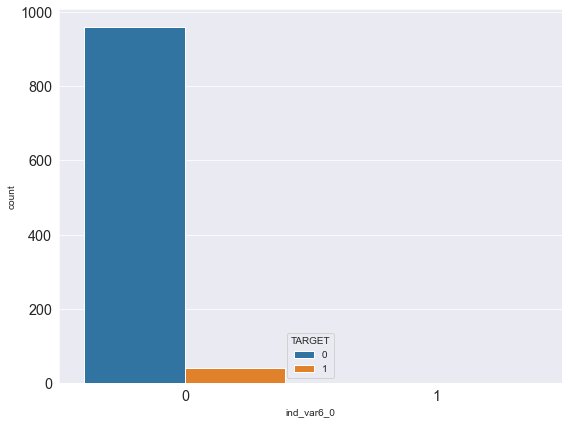

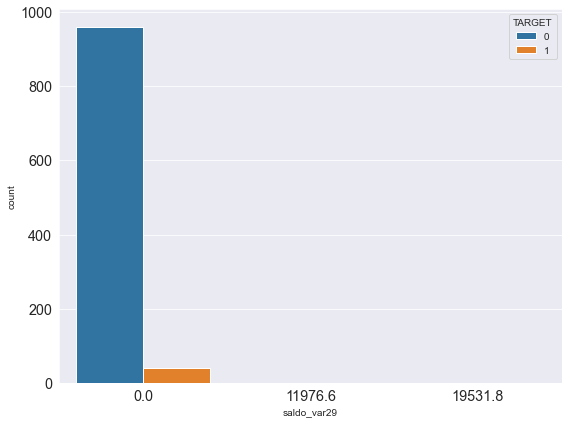

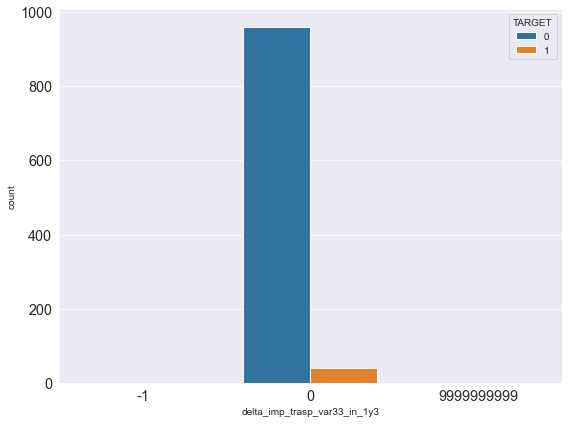

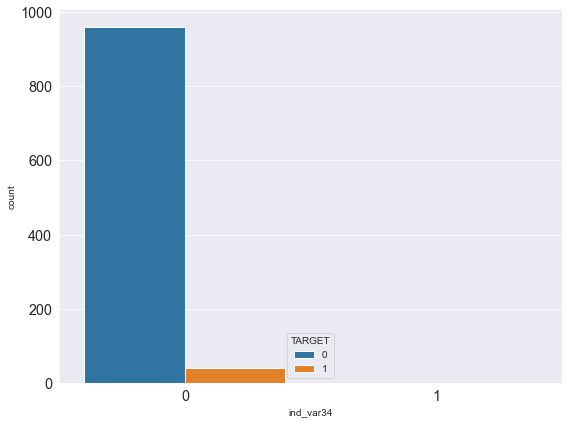

...

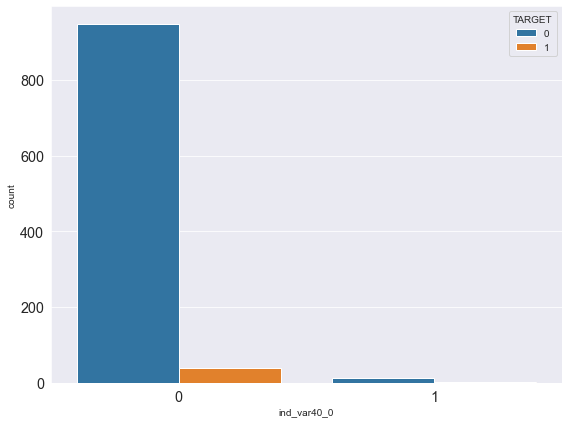

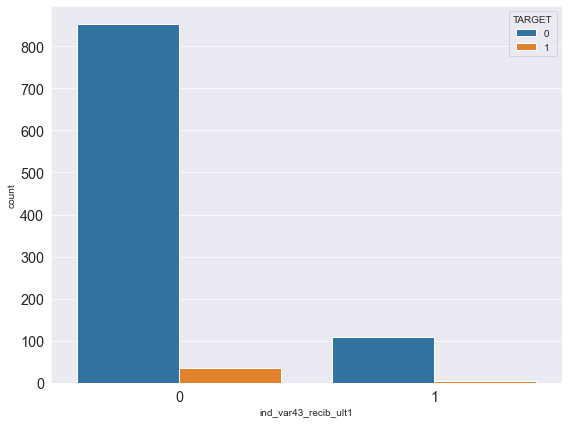

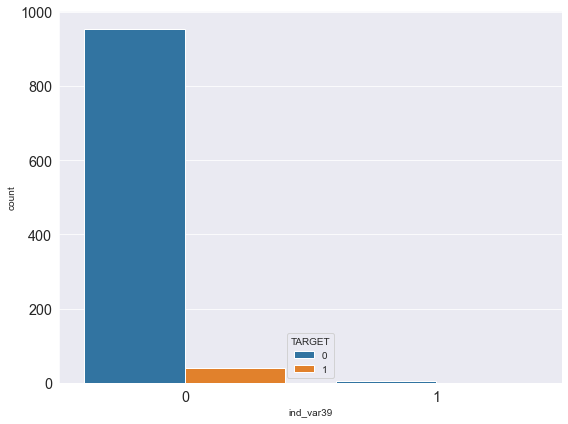

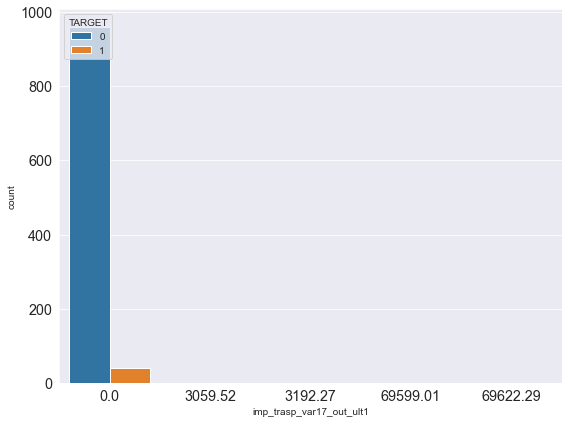

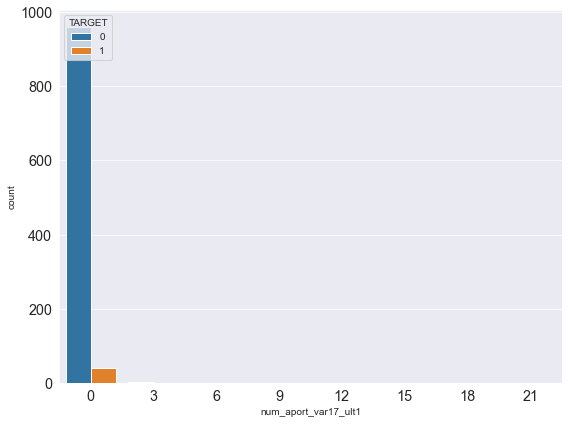

In [22]:
# Análise bivariada das variáveis categóricas // Bivariate analysis of categorical variables

def plot_countplot_cat_target(df, target, features_list:list):
    """
    Função para análise bivariada de variáveis categóricas com gráficos de contagem da biblioteca Seaborn.
    Function for bivariate analysis of categorical variables with count graphs from the Seaborn library.
    """
    for i in range(0, len(features_list)):
        plt.figure(figsize = (8, 6))
        chart = sns.countplot(x = features_list[i], data = df, hue = target)
        plt.tight_layout()
    
    return chart

# Chamada à função

plot_countplot_cat_target(df_sample, target, cat_features);

_**Observação:**_
Muitas variáveis categóricas apresentam categorias com frequência muito baixa, o que sugere pouca representatividade para a previsão da target.
---
_**Observation:**_
_Many categorical variables present categories with a very low frequency, which suggests little representativeness for the target prediction._

### Exploração das Variáveis Numéricas // _Exploration of Numerical Variables_

In [23]:
# Resumo das variáveis numéricas // Summary of numeric variables
df[num_features].describe()

,saldo_medio_var17_ult3,num_op_var40_comer_ult1,saldo_medio_var8_ult3,num_med_var22_ult3,saldo_medio_var5_hace2,saldo_medio_var5_ult1,saldo_var13_corto,imp_aport_var33_hace3,var3,saldo_medio_var13_largo_ult3,...,imp_aport_var13_ult1,saldo_var12,imp_var7_recib_ult1,imp_aport_var13_hace3,num_op_var40_comer_ult3,imp_venta_var44_ult1,saldo_medio_var17_hace3,saldo_medio_var44_ult1,imp_aport_var17_ult1,saldo_var17
count,7.602000e+04,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,...,76020.000000,7.602000e+04,7.602000e+04,76020.000000,76020.000000,7.602000e+04,7.602000e+04,76020.000000,76020.000000,7.602000e+04
mean,1.092169e+02,0.074980,110.026575,0.635872,1579.135311,1077.256756,4993.752970,2.985793,-1523.199277,7.509563e+02,...,619.585010,6.021616e+03,1.276982e+02,2823.949089,0.144830,8.143383e+01,3.646318e+01,76.026165,31.105323,1.834059e+02
std,1.308216e+04,2.089408,1935.305713,1.835267,12148.452398,9614.906985,32619.134245,226.862984,39033.462364,1.242252e+04,...,11252.995089,4.814471e+04,6.368997e+03,25334.468106,4.288145,1.128241e+04,8.612395e+03,4040.337842,2457.091282,2.269813e+04
min,0.000000e+00,0.000000,-1844.520000,0.000000,-128.370000,-922.380000,0.000000,0.000000,-999999.000000,0.000000e+00,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00
25%,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000e+00,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00
50%,0.000000e+00,0.000000,0.000000,0.000000,3.000000,3.000000,0.000000,0.000000,2.000000,0.000000e+00,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00
75%,0.000000e+00,0.000000,0.000000,0.000000,90.000000,90.000000,0.000000,0.000000,2.000000,0.000000e+00,...,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00
max,3.525777e+06,210.000000,177582.000000,78.000000,812137.260000,601428.600000,450000.000000,36000.000000,238.000000,1.034483e+06,...,450000.000000,3.008077e+06,1.039260e+06,840000.000000,582.000000,2.754476e+06,2.368559e+06,681462.900000,432457.320000,6.119500e+06


In [24]:
#### Medidas de Forma da Distribuição // Distribuition shape measures

## Assimetria (Skewness)

# A direção da assimetria é dada pelo sinal. Um zero significa nenhuma assimetria.
# Um valor negativo significa que a distribuição é negativamente assimétrica. Um valor possitivo, que é positivamente
# assimétrica.

# O coeficiente compara a distribuição da amostra com uma distribuição normal: quanto maior o valor, mais a distribuição
# difere de uma distribuição normal.


## Curtose (Kurtosis)

# Utilizado para medir o grau de achatamento ou curtose de uma distribuição, calculado a partir do intervalo interquartil
# dos percentis de ordem 10 e 90.

# Mesocúrtica: k = 0,263; Platicúrtica: k > 0,263; Leptocúrtica: k < 0,263


### Cálculo das medidas
skewness = {}
kurtosis = {}
for feat in num_features:
    skewness.update({feat: df[feat].skew()})
    kurtosis.update({feat: df[feat].kurtosis()})

# Dataframe com medidas de forma
df_sk = pd.Series(skewness).to_frame()
df_ku = pd.Series(kurtosis).to_frame().rename(columns={'0': 'kurtosis'})
df_sk_ku = pd.concat([df_sk, df_ku,], axis=1)
df_sk_ku = df_sk_ku.T
df_sk_ku.index = ['skewness', 'kurtosis']

# Consolidação com describe
df_stats = df.describe()
df_stats = pd.concat([df_stats, df_sk_ku], axis=0)
#df_stats

In [25]:
# Análise das estatísticas descritivas // Analysis of descriptive statistics

df_stats_analysis = df_stats.T
df_stats_analysis['median - mean'] = df_stats_analysis['50%'] - df_stats_analysis['mean']
df_stats_analysis['max > 3avg'] = df_stats_analysis['max'] > (3 * df_stats_analysis['mean'])
df_stats_analysis['skewness > 1'] = df_stats_analysis['skewness'] > 1
df_stats_analysis['kurtosis > .263'] = df_stats_analysis['kurtosis']> 0.263

display(df_stats_analysis)

check1 = len(df_stats_analysis[abs(df_stats_analysis['median - mean']) > 10])
check2 = df_stats_analysis['max > 3avg'].sum()
check3 = df_stats_analysis['skewness > 1'].sum()
check4 = df_stats_analysis['kurtosis > .263'].sum()

print()
print(f'Existem {check1} variáveis com diferença entre mediana e média superior a 10 unidades.') # ver %
print(f'Existem {check2} variáveis com valor máximo superior ao triplo da média.')
print(f'Existem {check3} variáveis com skewness superior a 1.')
print(f'Existem {check4} variáveis com kurtosis superior a 0.263.')

,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,median - mean,max > 3avg,skewness > 1,kurtosis > .263
var3,76020.0,-1523.199277,39033.462364,-999999.00,2.0000,2.00,2.0000,238.00,-25.541574,650.389135,1525.199277,True,False,True
var15,76020.0,33.212865,12.956486,5.00,23.0000,28.00,40.0000,105.00,1.578367,2.519919,-5.212865,True,True,True
imp_ent_var16_ult1,76020.0,86.208265,1614.757313,0.00,0.0000,0.00,0.0000,210000.00,67.267512,6321.435132,-86.208265,True,True,True
imp_op_var39_comer_ult1,76020.0,72.363067,339.315831,0.00,0.0000,0.00,0.0000,12888.03,9.454298,145.398198,-72.363067,True,True,True
imp_op_var39_comer_ult3,76020.0,119.529632,546.266294,0.00,0.0000,0.00,0.0000,21024.81,9.735351,155.618112,-119.529632,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
saldo_medio_var44_hace2,76020.0,31.505324,2013.125393,0.00,0.0000,0.00,0.0000,438329.22,151.919257,30353.704208,-31.505324,True,True,True
saldo_medio_var44_hace3,76020.0,1.858575,147.786584,0.00,0.0000,0.00,0.0000,24650.01,120.067707,16768.183173,-1.858575,True,True,True
saldo_medio_var44_ult1,76020.0,76.026165,4040.337842,0.00,0.0000,0.00,0.0000,681462.90,104.133358,13897.745166,-76.026165,True,True,True
saldo_medio_var44_ult3,76020.0,56.614351,2852.579397,0.00,0.0000,0.00,0.0000,397884.30,93.956775,10842.213607,-56.614351,True,True,True



Existem 75 variáveis com diferença entre mediana e média superior a 10 unidades.
Existem 131 variáveis com valor máximo superior ao triplo da média.
Existem 130 variáveis com skewness superior a 1.
Existem 131 variáveis com kurtosis superior a 0.263.


**Algumas observações:**

1. 75 variáveis numéricas não parecem ter uma distribuição simétrica (média e mediana são bastante diferentes).

2. 131 variáveis parecem ter valores outliers visto que seus valores máximos ultrapassam o triplo da média.

3. O coeficiente de assimetria (Skewness) compara a distribuição da amostra com uma distribuição normal: quanto maior o valor, mais a distribuição difere de uma distribuição normal. No dataset em análise, 130 variáveis apresentam skewness superior a 1.

4. O coeficiente de curtose (Kurtosis), utilizado para medir o grau de achatamento de uma distribuição, é calculado a partir do intervalo interquartil dos percentis de ordem 10 e 90. No caso, 131 variáveis apresentam coeficiente superior a 0.263, o que demonstra distribuições platicúrticas.

---
_**Some observations:**_

1. _75 numeric variables do not appear to have a symmetrical distribution (mean and median are quite different)._

2. _131 variables seem to have outliers as their maximum values ​​exceed three times the mean._

3. _The coefficient of skewness compares the sample distribution with a normal distribution: the higher the value, the more the distribution differs from a normal distribution. In the dataset under analysis, 130 variables have a skewness greater than 1._

4. _The kurtosis coefficient, used to measure the degree of flattening of a distribution, calculated from the interquartile range of the 10th and 90th percentiles. In this case, 131 variables have a coefficient greater than 0.263, which demonstrates platykurtic distributions._

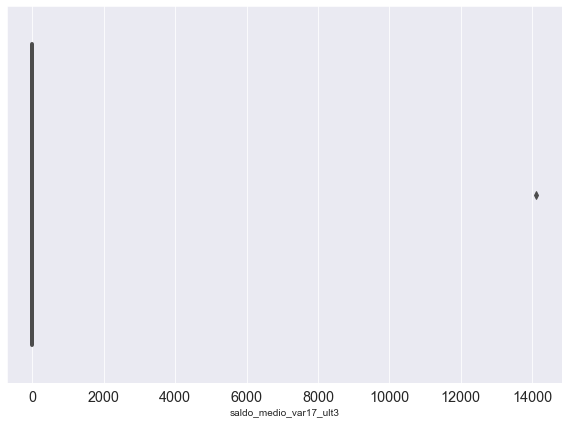

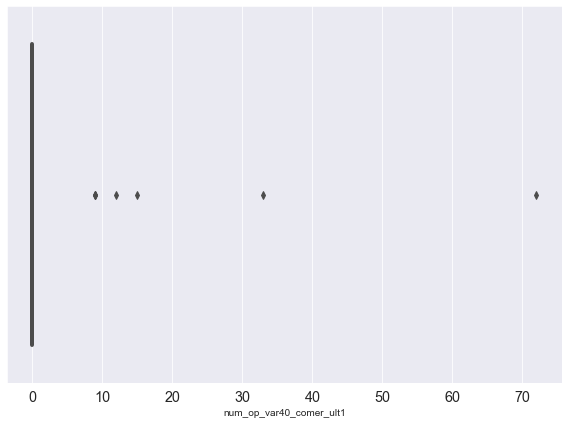

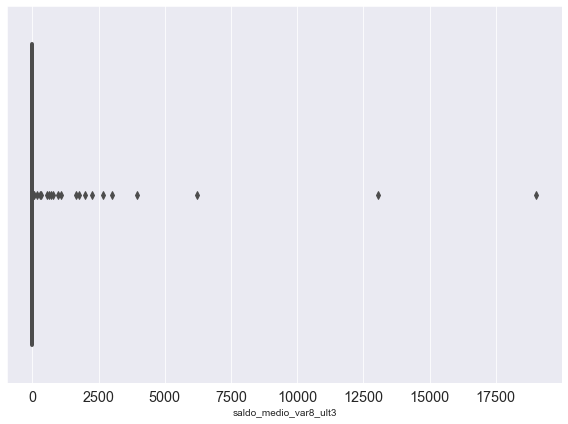

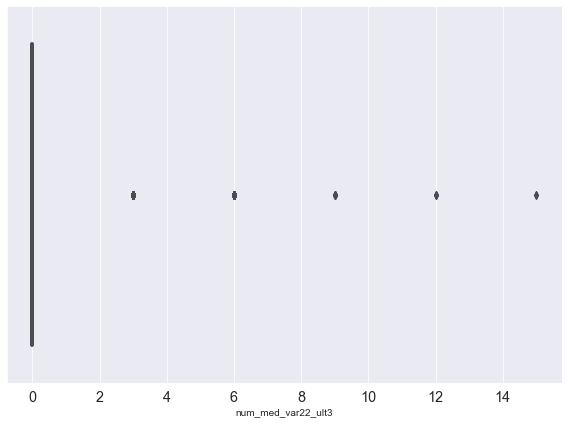

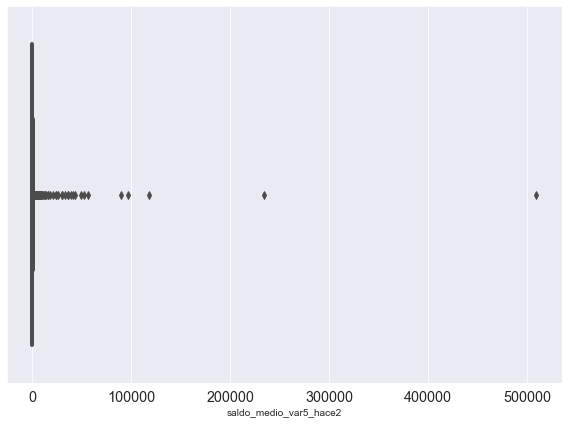

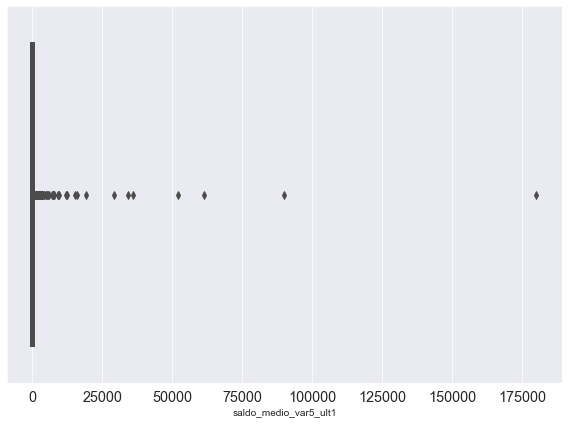

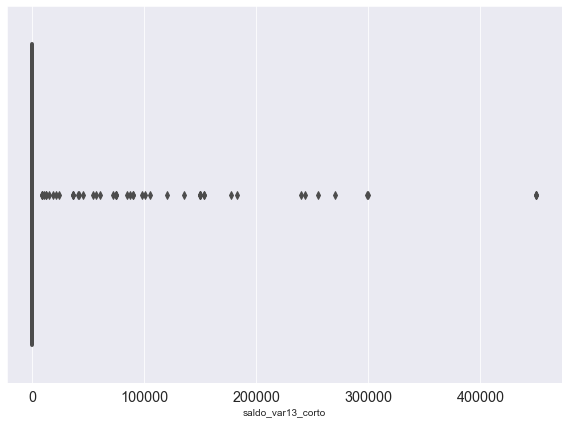

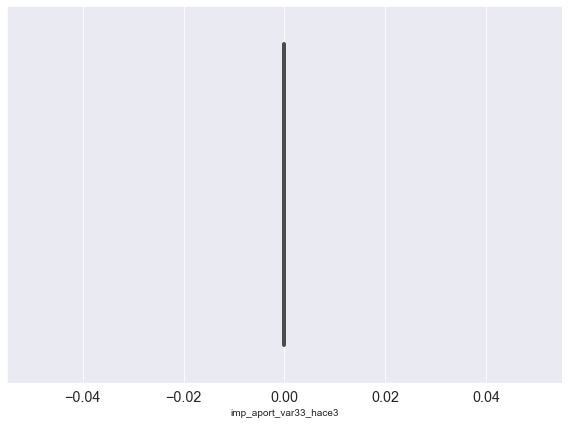

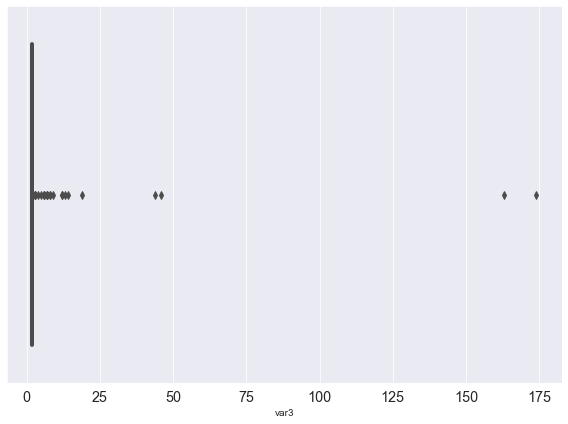

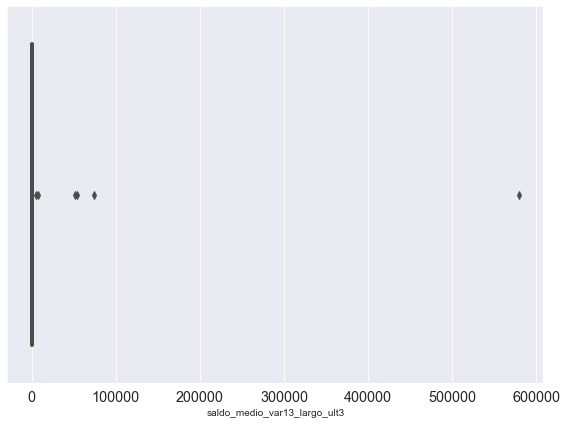

In [26]:
# Análise univariada das variáveis numéricas // Univariate analysis of numerical variables

# Funçõo para geração de boxplot
def plot_boxplot(df, features_list:list, orient:str='h'):
    """
    Função para análise univariada das variáveis numéricas utilizando gráficos boxplots da biblioteca Seaborn.
    Function for univariate analysis of numerical variables using boxplot plots from the Seaborn library.
    """
    for i in range(0, len(features_list)):
        plt.figure(figsize = (8, 6))
        chart = sns.boxplot(x = features_list[i], data=df, color = '#5975a5', orient = orient)
        plt.tight_layout()
    
    return chart

# Chamada à função para geração de boxplots (primeiras distribuições)
plot_boxplot(df=df_sample, features_list=num_features[:10], orient = 'v');

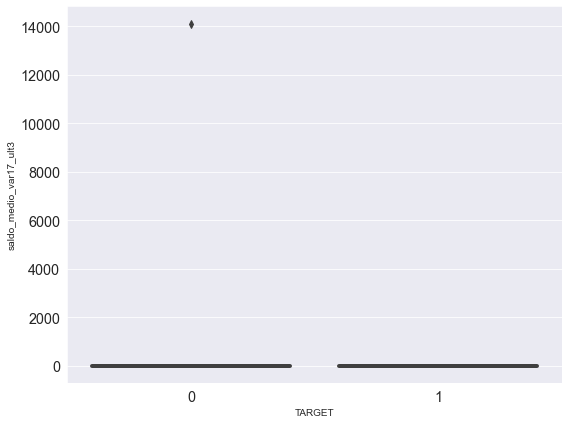

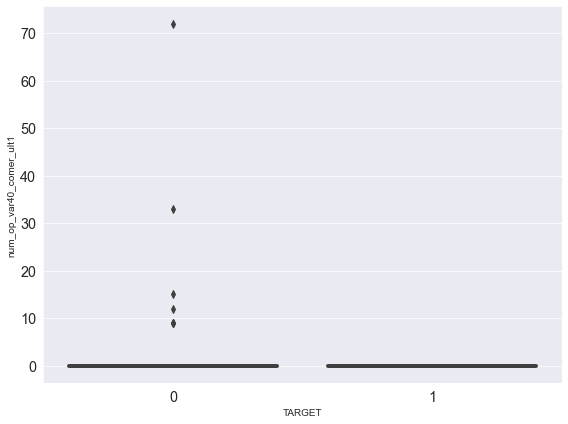

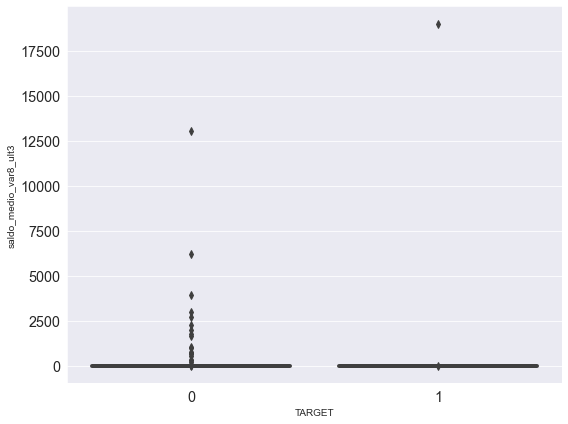

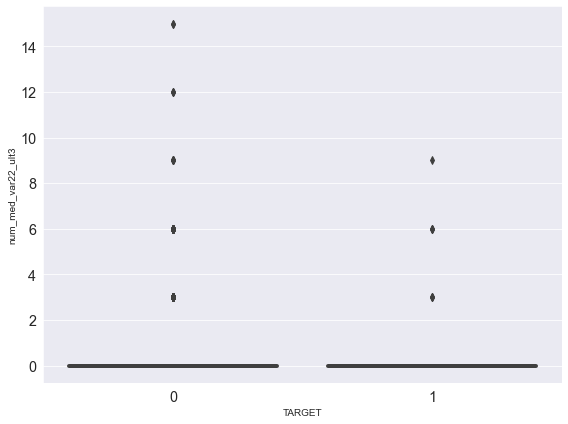

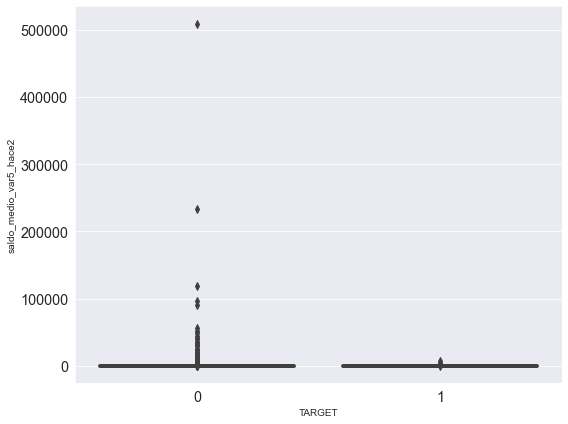

...

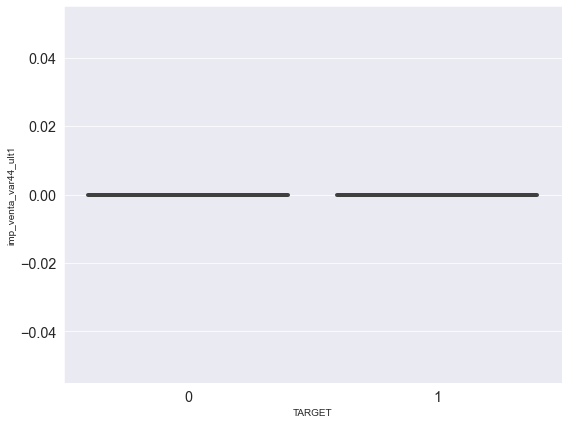

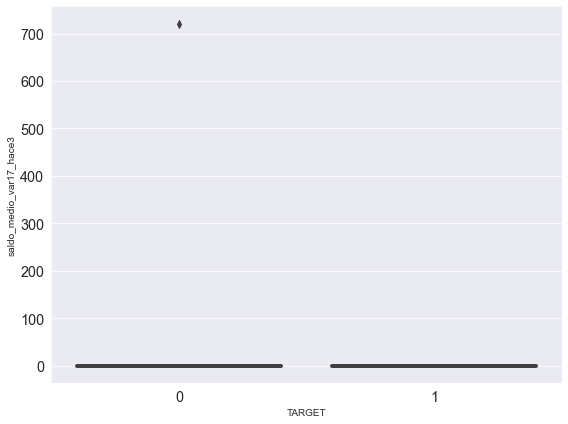

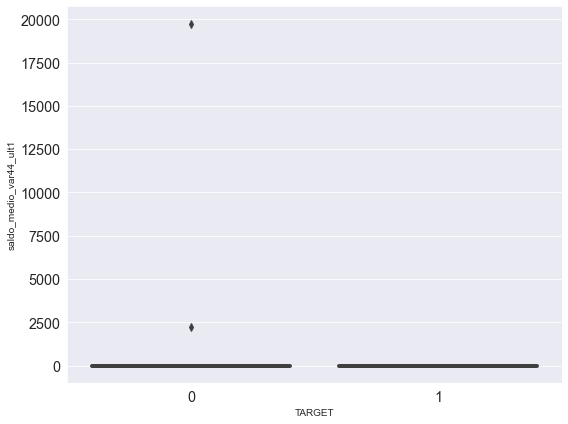

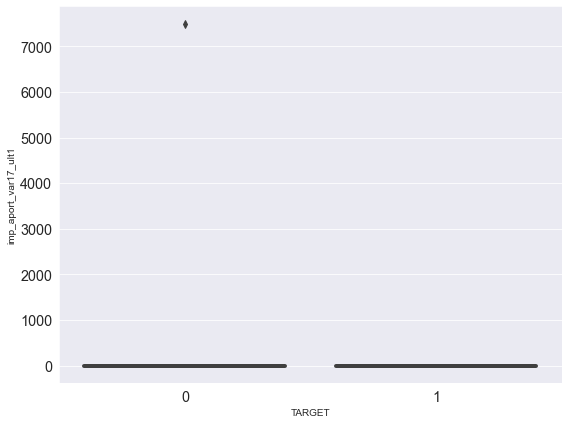

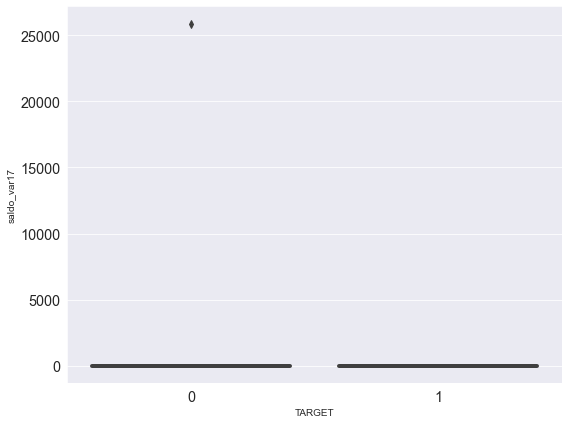

In [27]:
# Análise bivariada das variáveis numéricas // Bivariate analysis of numerical variables

def plot_boxplot_num_target(df, target, features_list:list):
    """
    Função para análise bivariada de variáveis numéricas com boxplots da biblioteca Seaborn.
    Function for bivariate analysis of numerical variables with boxplot graphs from the Seaborn library.
    """
    for i in range(0, len(features_list)):
        plt.figure(figsize = (8, 6))
        chart = sns.boxplot(y = features_list[i], x = target, data = df)
        plt.tight_layout()
    
    return chart

# Chamada à função

plot_boxplot_num_target(df_sample, target, num_features);

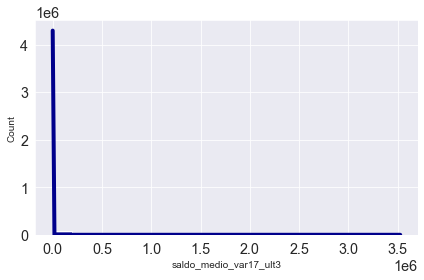

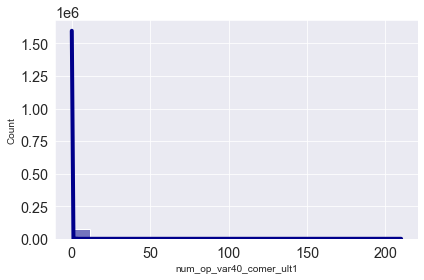

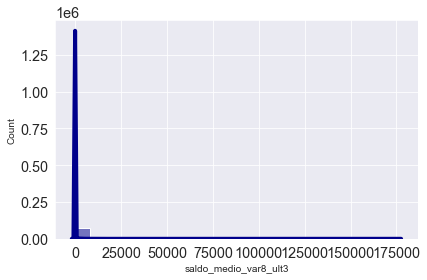

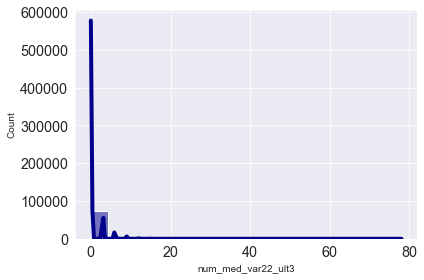

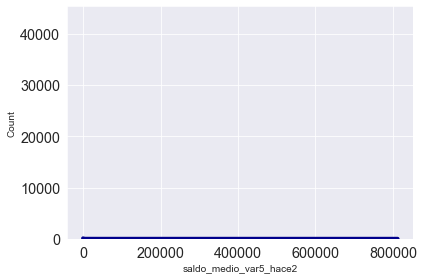

In [28]:
# Análise univariada das variáveis numéricas // Univariate analysis of numerical variables

# Funçõo para geração de distplot # fazer sample para otimizar tempo de processamento
def plot_distplot(df, features_list:list, color:str='darkblue', orient:str='v'):
    """
    Função para análise univariada das variáveis numéricas utilizando gráficos distplots da biblioteca Seaborn.
    Function for univariate analysis of numerical variables using distplot plots from the Seaborn library.
    """
    for i in range(0, len(features_list)):
        plt.figure(figsize = (6, 4))
        chart = sns.histplot(x = df[features_list[i]], kde = True, color = color)
        plt.xlabel(features_list[i])
        plt.tight_layout()
    
    return chart

# Chamada à função
plot_distplot(df=df, features_list=num_features[:5]);

**Observação:**

1. Os boxplots  e os histogramas das variáveis numéricas estão bem irregulares, com picos e hastes longas, o que sugere a presença de viés. Com vistas a compreender melhor o comportamento da distribuição dessas variáveis, pode-se aplicar a transformação logarítmica, para suavizar a diferença entre os valores extremos e os demais.

 
---
_**Observation:**_

1. _The boxplots and histograms of the numerical variables are very irregular, with peaks and long stems, which suggests the presence of bias. In order to better understand the behavior of the distribution of these variables, the logarithmic transformation can be applied to smooth the difference between the extreme values ​​and the others._



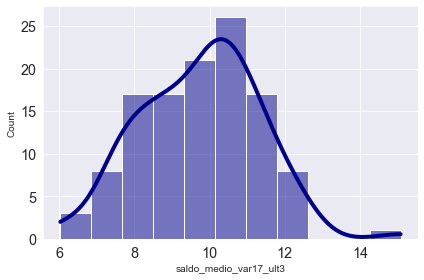

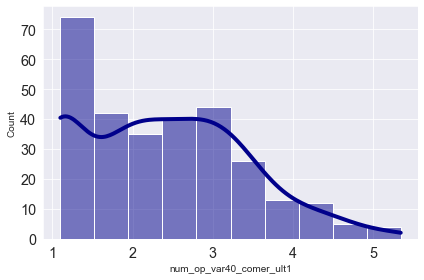

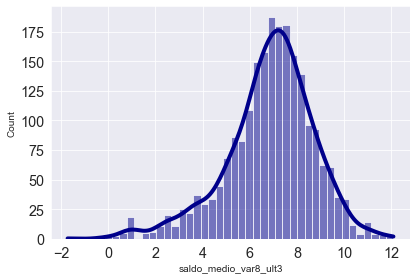

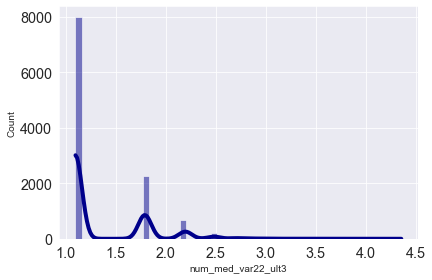

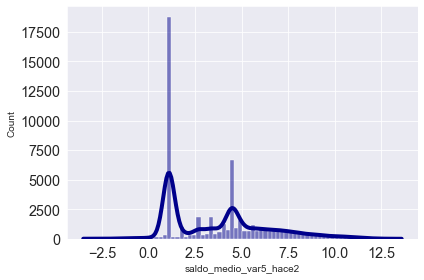

...

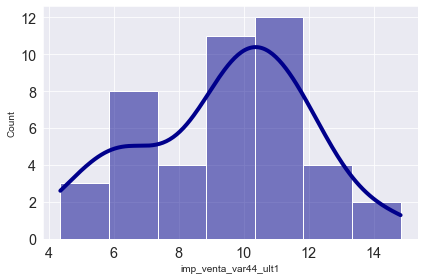

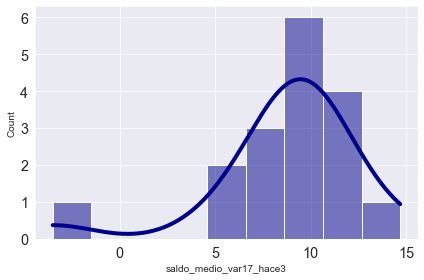

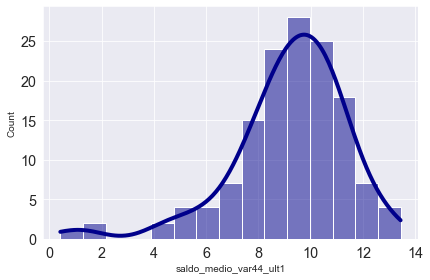

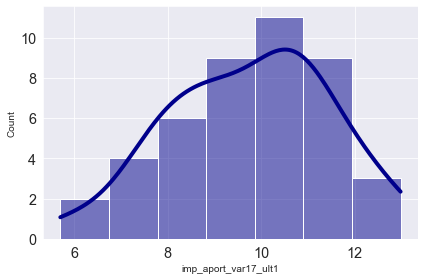

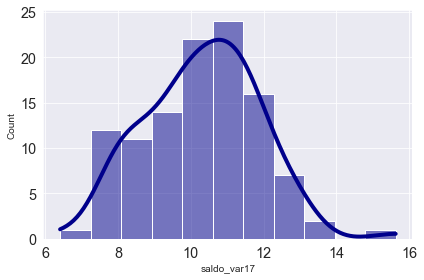

In [29]:
# Aprofundamento da análise das variáveis com transformação logarítmica
# Deepening the analysis of variables with logarithmic transformation


# Funçõo para geração de distplot com log da variável
def plot_distplot_log(df, features_list:list, color:str='darkblue', orient:str='v'):
    """
    Função para análise univariada das variáveis numéricas utilizando log e gráficos distplots da biblioteca Seaborn.
    Function for univariate analysis of numerical variables using log and distplot plots from the Seaborn library.
    """
    for i in range(0, len(features_list)):
        plt.figure(figsize = (6, 4))
        chart = sns.histplot(x = np.log(df[features_list[i]]), kde = True, color = color)
        plt.xlabel(features_list[i])
        plt.tight_layout()

    return chart

# Chamada à função
issue_feat = num_features
plot_distplot_log(df=df, features_list=issue_feat);

**Algumas observações:**
1. Os distplots das variáveis sugerem que, em grande parte, após a aplicação de transformação logarítmica aos seus valores, elas seguem uma distribuição normal.
2. Os displots de algumas variáveis, entretanto, como num_op_var40_comer_ult1, num_var45_hace3, num_op_var41_ult1, num_op_var39_hace2, num_op_var41_efect_ult3, num_op_var41_efect_ult1, num_med_var22_util3 etc., sugerem que tais atributos seguem uma distribuição uniforme.

---
_**Some observations:**_
1. _The distplots of the variables suggest that, for the most part, after applying logarithmic transformation to their values, they follow a normal distribution.._
2. _The displots of some variables, however, like num_op_var40_comer_ult1, num_var45_hace3, num_op_var41_ult1, num_op_var39_hace2, num_op_var41_efect_ult3, num_op_var41_efect_ult1, num_med_var22_util3 etc., suggest that such attributes follow a uniform distribution._


### Análise Bivariada - Mapa de Correlação // _Bivariate Analysis - Correlation Map_

In [30]:
# Matriz de correlação para as variáveis preditoras numéricas // Correlation matrix for numerical predictor variables
corr_df = df[num_features].corr()

# Matriz com filtro de correlação maior ou igual a .9
high_corr_df = corr_df[corr_df>=.9]

In [31]:
# Checando (in)existência de correlação negativa menor que -.9
corr_df[corr_df < -.9].isnull().sum()

saldo_medio_var17_ult3     131
num_op_var40_comer_ult1    131
saldo_medio_var8_ult3      131
num_med_var22_ult3         131
saldo_medio_var5_hace2     131
                          ... 
imp_venta_var44_ult1       131
saldo_medio_var17_hace3    131
saldo_medio_var44_ult1     131
imp_aport_var17_ult1       131
saldo_var17                131
Length: 131, dtype: int64

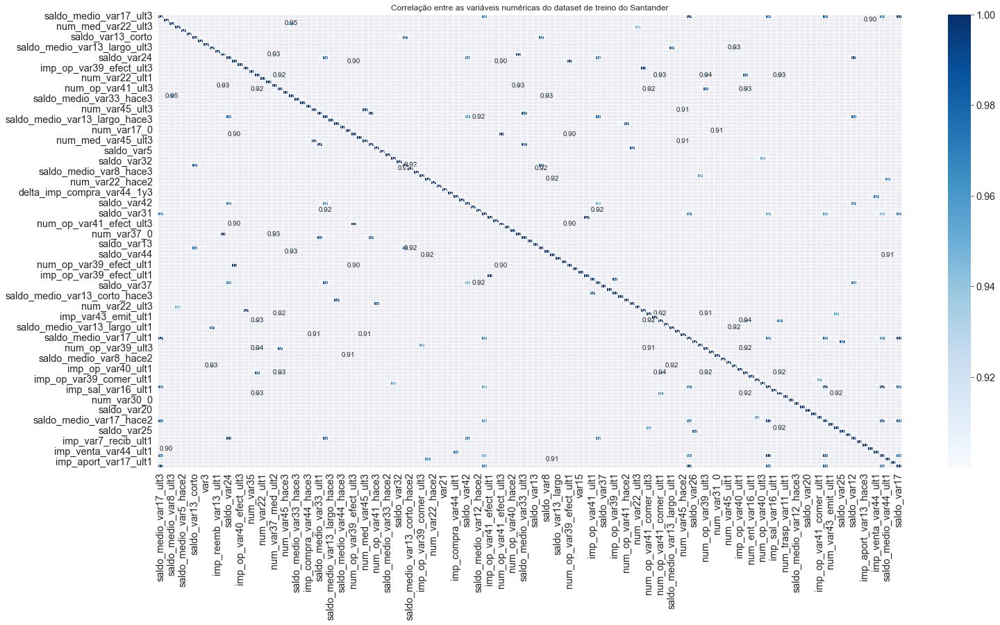

In [32]:
# Heatmap das correlações entre as variáveis numéricas

plt.figure(figsize = (24, 12))
sns.heatmap(high_corr_df, cmap = 'Blues', annot = True, linewidths = .5, fmt = '.2f')
plt.title('Correlação entre as variáveis numéricas do dataset de treino do Santander');

_**Observação:**_
O mapa de calor de correlação entre as variáveis preditoras sugere a existência de multicolinearidade.
---
_**Observation:**_
_The correlation heat map between the predictor variables suggests the existence of multicollinearity._

In [33]:
# Identificação de atributos com correlação superior a 0.9 (indicação de multicolinearidade)
# Identification of attributes with correlation greater than 0.9 (indication of multicollinearity)

dict_corr = {}
for idx in high_corr_df.index:
    for col in high_corr_df.columns:
        corr = high_corr_df.loc[idx, col]
        if (idx != col) & (corr >= .9):
            if idx not in dict_corr.keys():
                dict_corr[idx] = [col, corr]

print(f'Quantidade de variáveis com alta correlação (> .9): {len(dict_corr.keys())}')
print()
for key, value in dict_corr.items():
    print(f'Variáveis com alta correlação ({value[1]}):     {key} e {value[0]}')

Quantidade de variáveis com alta correlação (> .9): 73

Variáveis com alta correlação (0.9722421234892358):     saldo_medio_var17_ult3 e saldo_var31
Variáveis com alta correlação (0.900008497508347):     num_op_var40_comer_ult1 e num_op_var40_comer_ult3
Variáveis com alta correlação (0.9469840661387587):     saldo_medio_var8_ult3 e saldo_medio_var8_ult1
Variáveis com alta correlação (0.948403482370903):     num_med_var22_ult3 e num_var22_ult3
Variáveis com alta correlação (0.9886665901040325):     saldo_var13_corto e saldo_medio_var13_corto_ult1
Variáveis com alta correlação (0.987061840982244):     saldo_medio_var13_largo_ult3 e saldo_medio_var13_largo_ult1
Variáveis com alta correlação (0.9261910028554168):     num_var37 e num_var37_med_ult2
Variáveis com alta correlação (0.9846356794982141):     saldo_var24 e saldo_medio_var12_ult1
Variáveis com alta correlação (0.9028392317341578):     num_op_var41_efect_ult1 e num_op_var39_efect_ult3
Variáveis com alta correlação (0.99927093425264

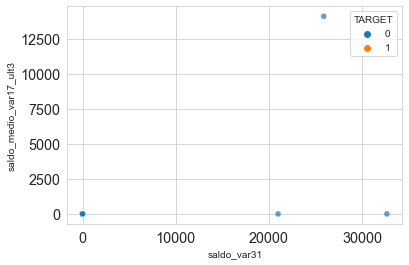

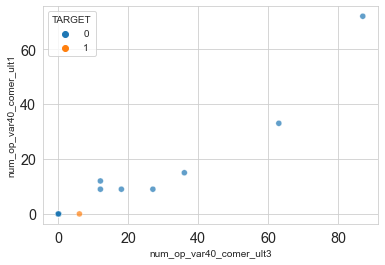

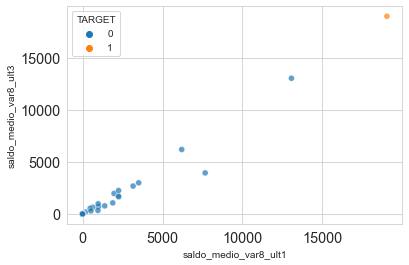

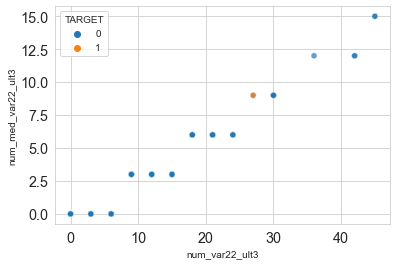

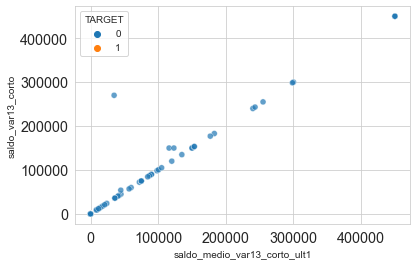

...

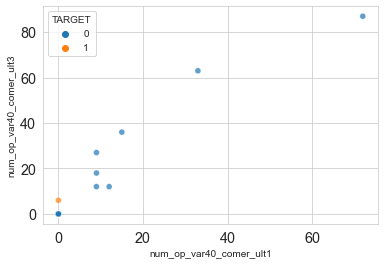

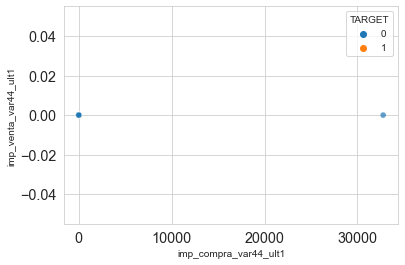

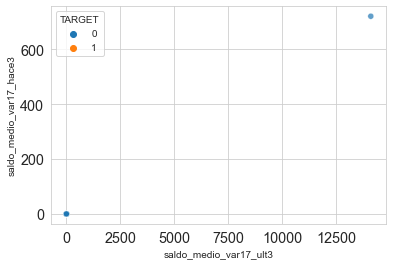

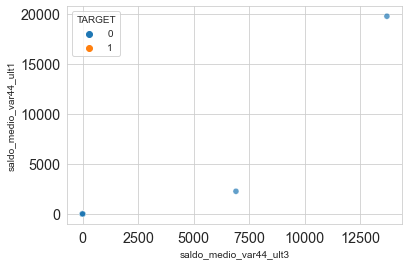

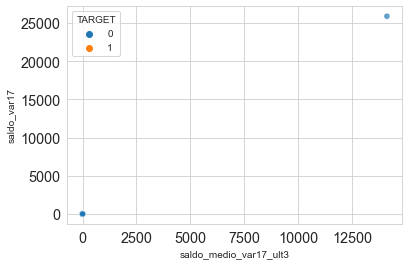

In [34]:
# Gráfico de Dispersão para confirmar a presença de multicolinearidade entre algumas variáveis

sns.set_style('whitegrid')

for idx, value in dict_corr.items():
    plt.figure(figsize = (6, 4))
    sns.scatterplot(y=idx, x=value[0], data=df_sample, hue=target, alpha=0.7)
    plt.show();


**Algumas observações:**

1. Existem 73 incidências de correlação igual ou superior a 0.9, o que reforça a percepção de que exite multicolineariade entre atributos.

2. Os gráficos de dispersão, entretanto, não autorizam essa mesma conclusão para alguns casos, como no relacionamentos entre os atributos imp_venta_var44_ult1 e imp_compra_var44_util1, por exemplo.

---
_**Some observations:**_

1. _There are 73 incidences of correlation equal to or greater than 0.9, which reinforces the perception that there is multicollinearity between attributes._

2. _The scatterplots, however, do not allow this same conclusion for some cases, as in the relationship between the attributes imp_venta_var44_ult1 and imp_compra_var44_util1, for example._


End